<a href="https://colab.research.google.com/github/LisaLOUNIS/NLP/blob/main/TD3_NLP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import re
import nltk

from gensim.models import word2vec

from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
data = pd.read_csv('train.csv').sample(50000, random_state=23)

In [ ]:
STOP_WORDS = nltk.corpus.stopwords.words()

In [ ]:
def clean_sentence(val):
    "remove chars that are not letters or numbers, downcase, then remove stop words"
    regex = re.compile('([^\s\w]|_)+')
    sentence = regex.sub('', val).lower()
    sentence = sentence.split(" ")

    for word in list(sentence):
        if word in STOP_WORDS:
            sentence.remove(word)

    sentence = " ".join(sentence)
    return sentence

In [ ]:
def clean_dataframe(data):
    "drop nans, then apply 'clean_sentence' function to question1 and 2"
    data = data.dropna(how="any")

    for col in ['question1', 'question2']:
        data[col] = data[col].apply(clean_sentence)

    return data

In [ ]:
data = clean_dataframe(data)
data.head(5)

,id,qid1,qid2,question1,question2,is_duplicate
237921,237921,9732,79801,sex relationship,sex important relationship,1
181001,181001,277377,277378,inspiring start stories,inspirational stories,0
294691,294691,150129,93109,digital marketing,unique ways digital marketing,1
104145,104145,171986,171987,grow facebook page,followers facebook page,1
357893,357893,487310,487311,suppose host sends tcp segments back back host...,suppose host sends tcp segments back back host...,1


In [ ]:
def build_corpus(data):
    "Creates a list of lists containing words from each sentence"
    corpus = []
    for col in ['question1', 'question2']:
        for sentence in data[col].items():
        #for sentence in data[col]:
            #print(sentence)
            word_list = sentence[1].split(" ")
            corpus.append(word_list)

    return corpus

In [ ]:
corpus = build_corpus(data)
corpus[0:2]

[['sex', 'relationship'], ['inspiring', 'start', 'stories']]

In [ ]:
corpus[0:10]

[['sex', 'relationship'],
 ['inspiring', 'start', 'stories'],
 ['digital', 'marketing'],
 ['grow', 'facebook', 'page'],
 ['suppose',
  'host',
  'sends',
  'tcp',
  'segments',
  'back',
  'back',
  'host',
  'b',
  'tcp',
  'connection',
  'segment',
  'sequence',
  'number',
  '140',
  'sequence',
  'number',
  '170'],
 ['sahara', 'average', 'temperatures', 'compare', 'dashte', 'loot'],
 ['possible', 'disable', 'facetimes', 'call', 'button'],
 ['agencies', 'fulfil', 'sex', 'fantasies', 'usa'],
 ['signs', 'mentally', 'weak'],
 ['different', 'quora']]

In [ ]:
model = word2vec.Word2Vec(corpus, vector_size=100, window=20, min_count=200, workers=4)

# corpus = Le corpus de données à partir duquel le modèle apprendra les embeddings de mots
# vector_size = 100 : Chaque mot sera représenté par un vecteur de 100 dimensions
# window = 20 : Le modèle considérera un contexte de 20 mots autour de chaque mot lors de l'apprentissage

model.wv['trump']

#Cette ligne de code accède au vecteur d'embedding du mot "trump" dans le modèle Word2Vec une fois qu'il est créé.
#Le résultat de cette ligne de code est le vecteur numérique de 100 dimensions qui représente le mot "trump" dans l'espace vectoriel appris par le modèle.

array([ 0.21044952,  0.48508126,  0.7853997 , -0.7488363 ,  0.7847148 ,
       -0.5601084 ,  0.7888448 ,  0.33710328,  0.31348294, -0.39605138,
       -0.25877452, -1.5908706 , -0.40400332, -0.61378515, -0.54302335,
        0.214046  ,  0.5082031 , -0.1284003 ,  0.45634615, -1.1636153 ,
        0.5628369 ,  1.0286889 , -0.1573059 , -0.10371097, -0.24811077,
        0.4778699 ,  0.5057288 , -0.20819998, -0.16404395,  0.04745496,
       -0.5364121 , -0.05338752,  0.19247626, -0.5134779 , -0.8100376 ,
       -0.13824241,  0.7648598 ,  0.21994483,  0.13959014, -1.0666863 ,
        0.11034344, -0.16348493,  1.0021782 ,  0.01241185,  0.63973737,
       -0.10746208, -0.6814895 ,  0.2915939 ,  0.29057053, -0.08960692,
        0.76537204, -0.16788992,  0.33973166, -0.07541277, -0.6150403 ,
        0.15692398,  0.5907518 ,  0.6071897 , -0.9664949 ,  0.33613804,
       -0.345111  ,  0.27520645,  0.3326073 ,  0.0649369 , -0.38236675,
        0.30346873, -0.4067044 ,  0.8360251 , -0.34338766, -0.04

In [ ]:
vocab = []
for i in range(0,len(model.wv)):
        vocab.append(model.wv.index_to_key[i])

#La boucle for parcourt les indices de 0 à la longueur du vocabulaire du modèle Word2Vec (len(model.wv)).
# Cela signifie qu'il parcourt tous les mots du vocabulaire du modèle un par un
#À chaque itération de la boucle,
# il utilise l'indice i pour accéder au mot correspondant dans le vocabulaire du modèle en utilisant model.wv.index_to_key[i]
#Le mot correspondant à l'indice i est ensuite ajouté à la liste "vocab" à l'aide de la méthode append.
#Cela ajoute progressivement tous les mots du vocabulaire du modèle à la liste "vocab".

In [ ]:
print(len(vocab))

381


In [ ]:
def tsne_plot(model):
  "Creates and TSNE model and plots it"
  labels = []
  tokens = []
  for word in vocab:
    tokens.append(model.wv[word])
    labels.append(word)
    #print(tokens)
    #print(labels)
  tokens = np.array(tokens)
  tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
  new_values = tsne_model.fit_transform(tokens)
  x = []
  y = []
  for value in new_values:
      x.append(value[0])
      y.append(value[1])

  plt.figure(figsize=(16, 16))
  for i in range(len(x)):
      plt.scatter(x[i],y[i])
      plt.annotate(labels[i], xy=(x[i], y[i]),xytext=(5, 2),textcoords='offset points',ha='right',va='bottom')
  plt.show()


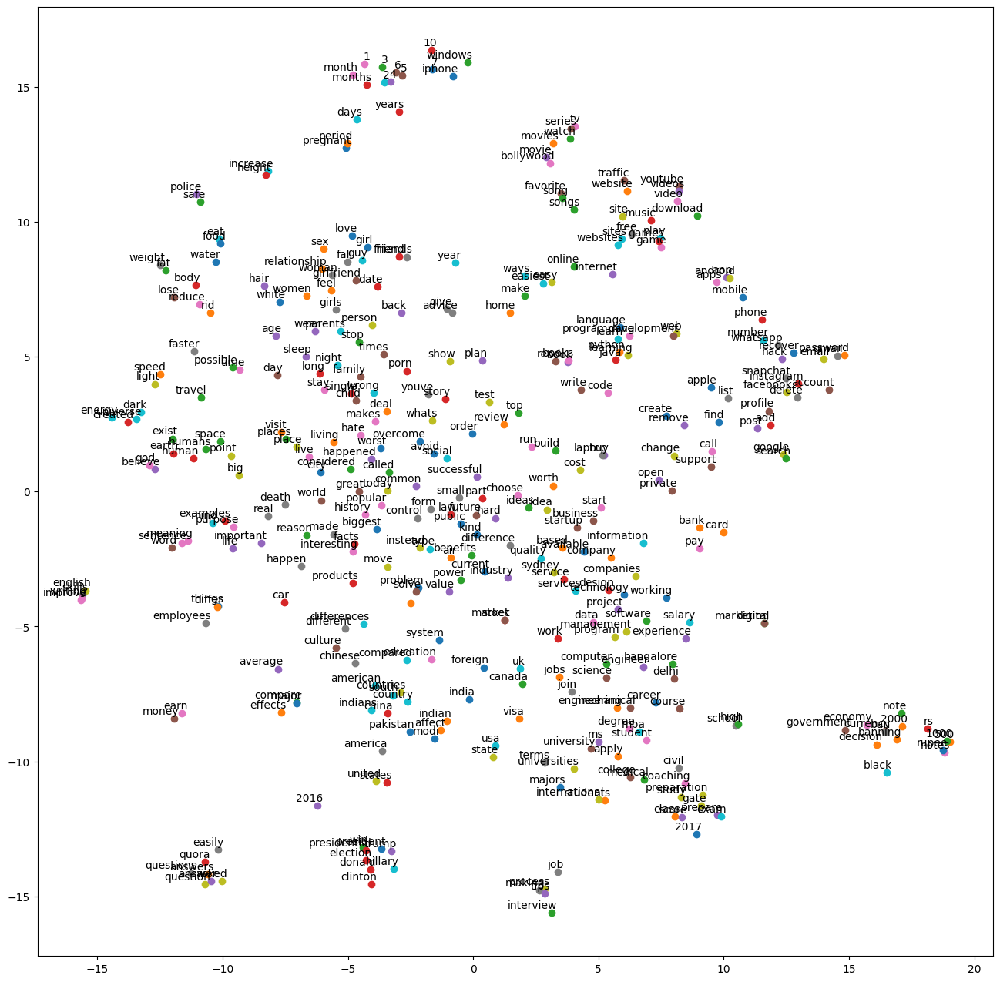

In [ ]:
tsne_plot(model)

# **Information** **Retrieval avec CNN**

In [ ]:
import pickle

def loadCNN():
	file = open("CNNArticles",'rb')
	articles = pickle.load(file)
	file = open("CNNGold",'rb')
	abstracts = pickle.load(file)

	articlesCl = []
	for article in articles:
		articlesCl.append(article.replace("”", "").rstrip("\n"))
	articles = articlesCl

	articlesCl = []
	for article in abstracts:
		articlesCl.append(article.replace("”", "").rstrip("\n"))
	abstracts = articlesCl

	return articles, abstracts

In [ ]:
articles, abstracts = loadCNN()

print("ARTICLE=", articles[0])

print("SUMMARY=", abstracts[0])


ARTICLE= turkey has blocked access to twitter and youtube after they refused a request to remove pictures of a prosecutor held during an armed siege last week . a turkish court imposed the blocks because images of the deadly siege were being shared on social media and ` deeply upset ' the wife and children of mehmet selim kiraz , the hostage who was killed . the 46-year-old turkish prosecutor died in hospital when members of the revolutionary people 's liberation party-front ( dhkp-c ) stormed a courthouse and took him hostage . the dhkp-c is considered a terrorist group by turkey , the european union and us . a turkish court has blocked access to twitter and youtube after they refused a request to remove pictures of prosecutor mehmet selim kiraz held during an armed siege last week grief : the family of mehmet selim kiraz grieve over his coffin during his funeral at eyup sultan mosque in istanbul , turkey . he died in hospital after he was taken hostage by the far-left organisation tw

In [ ]:
articles[1]

"deborah fuller has been banned from keeping animals after she dragged her dog behind her car , causing wounds as she drove at 30mph a dog breeder and exhibitor who dragged her pet behind her car at a speed of 30mph and failed to get painful wounds to its paws and chest treated , has been banned from keeping animals and had her dogs confiscated . deborah fuller , 56 , dragged her dog tango for 400 metres behind her car as she drove along the b1066 near long melford , essex . the rhodesian ridgeback was left with injuries to all four paws as well as grazing to his chest and a deep wound on his elbow . he is believed to have somehow escaped from the boot of her car and was dragged along the single carriageway because his lead was attached to the vehicle 's tailgate . fuller , of lawford , essex , denied causing unnecessary suffering to an animal by not taking it to the vets and failing to take steps to safely secure a dog within a vehicle , but was convicted following a hearing at chelms

In [ ]:
import nltk
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string

In [ ]:
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
def preprocess_text(text):
    # Tokenisation
    tokens = word_tokenize(text)

    # Conversion en minuscules
    tokens = [token.lower() for token in tokens]

    # Suppression de la ponctuation
    tokens = [token for token in tokens if token not in string.punctuation]

    # Suppression des stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]

    # Lemmatisation (ou stemming)
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return tokens


In [ ]:
preprocessed_documents = [preprocess_text(article) for article in articles[0:101]]
preprocessed_summaries = [preprocess_text(abstract) for abstract in abstracts[0:101]]

In [ ]:
preprocessed_documents

[['turkey',
  'blocked',
  'access',
  'twitter',
  'youtube',
  'refused',
  'request',
  'remove',
  'picture',
  'prosecutor',
  'held',
  'armed',
  'siege',
  'last',
  'week',
  'turkish',
  'court',
  'imposed',
  'block',
  'image',
  'deadly',
  'siege',
  'shared',
  'social',
  'medium',
  'deeply',
  'upset',
  'wife',
  'child',
  'mehmet',
  'selim',
  'kiraz',
  'hostage',
  'killed',
  '46-year-old',
  'turkish',
  'prosecutor',
  'died',
  'hospital',
  'member',
  'revolutionary',
  'people',
  "'s",
  'liberation',
  'party-front',
  'dhkp-c',
  'stormed',
  'courthouse',
  'took',
  'hostage',
  'dhkp-c',
  'considered',
  'terrorist',
  'group',
  'turkey',
  'european',
  'union',
  'u',
  'turkish',
  'court',
  'blocked',
  'access',
  'twitter',
  'youtube',
  'refused',
  'request',
  'remove',
  'picture',
  'prosecutor',
  'mehmet',
  'selim',
  'kiraz',
  'held',
  'armed',
  'siege',
  'last',
  'week',
  'grief',
  'family',
  'mehmet',
  'selim',
  'kira

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Créez un modèle Word2Vec pour les documents
model_documents = Word2Vec(preprocessed_documents, vector_size=100, window=5, min_count=1, sg=0)

# Créez un modèle Word2Vec pour les résumés (requêtes)
model_summaries = Word2Vec(preprocessed_summaries, vector_size=100, window=5, min_count=1, sg=0)

# Créez les vecteurs Word2Vec correspondants pour les résumés et les documents
query_vectors = [model_summaries.wv[summary] for summary in preprocessed_summaries]
document_vectors = [model_documents.wv[document] for document in preprocessed_documents]



In [ ]:
document_vectors

[array([[-1.0113420e+00,  1.1559669e+00,  6.8420702e-01, ...,
         -1.0181934e+00, -5.2496821e-01, -5.5867821e-01],
        [ 3.2223210e-01,  5.6808454e-01, -5.4437704e-02, ...,
          7.2382264e-02,  5.7005084e-01,  3.2223204e-01],
        [-1.6589468e+00,  4.2469305e-01,  4.8048168e-02, ...,
         -1.2563152e+00,  1.4265487e+00,  5.4969382e-01],
        ...,
        [-2.7950323e+00, -4.4366363e-01,  2.7569942e+00, ...,
         -4.4974864e-01, -1.3006033e+00, -1.2997565e+00],
        [-2.2045274e+00, -7.9093695e-01,  2.5058713e+00, ...,
          7.5880834e-04, -1.2429894e+00, -3.1187573e-01],
        [-1.1595155e+00, -8.1618255e-01,  6.9829202e-01, ...,
         -4.5911402e-01, -1.3257103e+00,  1.1270264e+00]], dtype=float32),
 array([[ 7.87739456e-02,  3.73640358e-02,  2.66421139e-01, ...,
         -1.92270949e-01, -4.89259630e-01,  4.03023362e-01],
        [-1.66783437e-01,  7.35545754e-02,  3.24816704e-01, ...,
         -4.02190953e-01, -1.04093246e-01,  4.32006389e-01]

In [ ]:
import numpy as np
# Créez une liste de vecteurs de documents
document_vectors = [model_documents.wv[document] for document in preprocessed_documents]

# Créez également une liste de vecteurs de résumés
query_vectors = [model_summaries.wv[summary] for summary in preprocessed_summaries]

# Empilez les vecteurs en matrices
document_matrix = np.vstack(document_vectors)
query_matrix = np.vstack(query_vectors)

# Calcul de la similarité cosinus entre chaque résumé par rapport à tous les documents
similarities_list = cosine_similarity(query_matrix, document_matrix)


# similarities_list contient maintenant la similarité cosinus entre chaque résumé (requête) et tous les documents
# Vous pouvez accéder aux scores de similarité pour chaque résumé en utilisant similarities_list[i]

In [17]:
len(similarities_list)

3490

In [ ]:
# Boucle pour parcourir les similarités
for i, query_vector in enumerate(query_vectors):
    print(f"Résumé {i+1}:")

    # Obtenez les scores de similarité pour le résumé actuel
    similarity_scores = similarities_list[i]

    # Parcourez les scores de similarité pour chaque document
    for j, score in enumerate(similarity_scores):
        print(f"Document {j+1}: Similarité = {score:.4f}")

    # Saut de ligne pour séparer les résumés
    print()


Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
Document 30738: Similarité = 0.1859
Document 30739: Similarité = -0.1592
Document 30740: Similarité = 0.1039
Document 30741: Similarité = 0.1954
Document 30742: Similarité = 0.2010
Document 30743: Similarité = 0.2106
Document 30744: Similarité = 0.2342
Document 30745: Similarité = 0.1591
Document 30746: Similarité = 0.0181
Document 30747: Similarité = -0.1311
Document 30748: Similarité = 0.0181
Document 30749: Similarité = 0.0470
Document 30750: Similarité = 0.2743
Document 30751: Similarité = 0.0470
Document 30752: Similarité = 0.1523
Document 30753: Similarité = 0.0470
Document 30754: Similarité = 0.2455
Document 30755: Similarité = -0.2374
Document 30756: Similarité = 0.0228
Document 30757: Similarité = 0.1846
Document 30758: Similarité = -0.0496
Document 30759: Similarité = -0.0177
Document 30760: Similarité = 0.1954
Document 30761: Similarité = 0.1214
Document 30762: Similarité = -0.0148
Document 30763: 

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-12-d1591b1c89e7>", line 10, in <cell line: 2>
    print(f"Document {j+1}: Similarité = {score:.4f}")
  File "/usr/local/lib/python3.10/dist-packages/ipykernel/iostream.py", line 402, in write
    self.pub_thread.schedule(lambda : self._buffer.write(string))
  File "/usr/local/lib/python3.10/dist-packages/ipykernel/iostream.py", line 203, in schedule
    self._event_pipe.send(b'')
  File "/usr/local/lib/python3.10/dist-packages/zmq/sugar/socket.py", line 618, in send
    return super().send(data, flags=flags, copy=copy, track=track)
  File "zmq/backend/cython/socket.pyx", line 740, in zmq.backend.cython.socket.Socket.send
  File "zmq/backend/cython/socket.pyx", line 787, in zmq.backend.cython.socket.Socket.send
  File "zmq/backend/cython/socket.pyx", line 244, in zmq.backe

TypeError: ignored

In [ ]:
# Créez une liste vide pour stocker les classements de documents
document_rankings = []

# Boucle pour parcourir les similarités pour chaque résumé
for similarity_scores in similarities_list:
    # Triez les indices des documents en fonction des scores de similarité décroissants
    document_indices_sorted = sorted(range(len(similarity_scores)), key=lambda i: similarity_scores[i], reverse=True)

    # Ajoutez la liste triée des indices de documents à la liste de classements
    document_rankings.append(document_indices_sorted)

# document_rankings contient maintenant les classements de documents pour chaque résumé
# Vous pouvez accéder aux classements individuels pour chaque résumé en utilisant document_rankings[i]


In [19]:
document_rankings[0]

[4047,
 8106,
 16864,
 17361,
 18605,
 17408,
 2992,
 3055,
 3088,
 9789,
 13648,
 15678,
 1280,
 1159,
 37434,
 24156,
 35359,
 35366,
 4185,
 1002,
 956,
 4835,
 4892,
 23467,
 26870,
 26909,
 13560,
 33278,
 8302,
 8440,
 8490,
 36922,
 19756,
 33325,
 33366,
 19760,
 8374,
 23796,
 34856,
 38886,
 35035,
 35108,
 35282,
 35294,
 35363,
 14822,
 25075,
 38293,
 25308,
 30346,
 30360,
 10718,
 17147,
 28667,
 951,
 997,
 16301,
 9939,
 17493,
 4797,
 31222,
 3550,
 2748,
 2799,
 29147,
 29187,
 29258,
 29265,
 29480,
 9849,
 10005,
 1476,
 27188,
 31685,
 1501,
 29946,
 33010,
 19404,
 1284,
 30177,
 30241,
 30387,
 38867,
 37496,
 4795,
 5566,
 22284,
 30026,
 37964,
 26859,
 26867,
 27732,
 5592,
 5606,
 5618,
 29072,
 28282,
 32804,
 18606,
 1568,
 2250,
 2339,
 20400,
 2846,
 23365,
 35770,
 20353,
 21334,
 28202,
 6412,
 8680,
 24709,
 13681,
 38056,
 38080,
 36104,
 9017,
 27284,
 14107,
 32512,
 38003,
 11777,
 11836,
 31865,
 37884,
 25301,
 25316,
 2551,
 3144,
 8754,
 32491